Imports

In [2]:
#!pip install community
import re
import ijson
import json
import seaborn as sns
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict
from collections import Counter
from itertools import combinations
import pandas as pd
import plotly.express as px
import numpy as np

In [1]:
KEYWORDS_PATH = "top_k_terms_per_doc_scored_filtered.json"
LAW_REF_PATH = "cd2LFs_crimLaw_Others_5k.json"

Utils Functions

In [3]:
def get_par_url(law_url, let_odsek=False):
    idx_odsek = law_url.find(".odsek-")
    idx_pismeno = law_url.find(".pismeno")

    trim_alphabet_regex = re.compile(r'[a-zA-Z]+$')

    if let_odsek:
        # If pismeno is False, remove only the .pismeno part
        if idx_pismeno != -1:
            law_url = law_url[:idx_pismeno]  # Trim at .pismeno
    else:
        # Consider both .odsek- and .pismeno
        if idx_odsek != -1 or idx_pismeno != -1:
            idx_to_cut = min(i for i in [idx_odsek, idx_pismeno] if i != -1)
            law_url = law_url[:idx_to_cut]  # Trim at the earliest occurrence
    
    # Remove trailing alphabetic characters
    return trim_alphabet_regex.sub('', law_url)

def top_k(B, selected_documents, mode='doc-keyword', top_k=5, plot=False):
    translations = {}

    # Separate nodes by their bipartite group
    document_nodes = [node for node, data in B.nodes(data=True) if data.get('bipartite') == 0]
    law_nodes = [node for node, data in B.nodes(data=True) if data.get('bipartite') == 1]
    keyword_nodes = [node for node, data in B.nodes(data=True) if data.get('bipartite') == 2]

    # Filter edges based on the mode
    if mode == 'doc-keyword':
        edge_filter = lambda u, v: (u in document_nodes and v in keyword_nodes) or (u in keyword_nodes and v in document_nodes)
        other_nodes = keyword_nodes
    elif mode == 'doc-law':
        edge_filter = lambda u, v: (u in document_nodes and v in law_nodes) or (u in law_nodes and v in document_nodes)
        other_nodes = law_nodes
    else:
        raise ValueError("Invalid mode. Use 'doc-keyword' or 'doc-law'.")

    # Extract edges for the selected mode
    edges = [(u, v, data) for u, v, data in B.edges(data=True) if edge_filter(u, v)]
    
    # Create a subgraph for the selected mode
    subgraph = nx.Graph()
    subgraph.add_edges_from((u, v, {'weight': data['weight']}) for u, v, data in edges)
    
    # Find neighbors of selected documents
    neighbors = set()
    for doc in selected_documents:
        if doc in subgraph:
            neighbors.update(subgraph.neighbors(doc))

    # Restrict subgraph to selected documents and their neighbors
    subgraph_nodes = set(selected_documents).union(neighbors)
    subgraph = subgraph.subgraph(subgraph_nodes).copy()  # Make a mutable copy of the subgraph

    # Remove nodes referenced by only one document (other than selected documents)
    nodes_to_remove = []
    for node in subgraph:
        if node not in selected_documents:
            referencing_docs = [doc for doc in selected_documents if doc in subgraph and node in subgraph.neighbors(doc)]
            if len(referencing_docs) <= 1:
                nodes_to_remove.append(node)
    
    subgraph.remove_nodes_from(nodes_to_remove)  # Now this works as subgraph is mutable

    # Separate nodes in the subgraph
    doc_nodes = [n for n in subgraph if n in selected_documents]
    other_nodes = [n for n in subgraph if n not in selected_documents]

    # Translate the other nodes using the translations dictionary
    translated_other_nodes = {node: translations.get(node, node) for node in other_nodes}

    # Calculate node sizes proportional to the sum of edge weights
    doc_node_size = 1000  # Fixed size for document nodes
    node_sizes = [doc_node_size if node in doc_nodes else sum(data['weight'] for _, _, data in subgraph.edges(node, data=True)) * 1000 for node in subgraph]

    # Calculate edge widths proportional to weights
    edge_widths = [data['weight'] * 5 for _, _, data in subgraph.edges(data=True)]

    # Create positions for bipartite layout
    pos = {}

    # Ensure positions for both document nodes and translated other nodes
    pos.update((node, (0, i)) for i, node in enumerate(doc_nodes))  # Documents on the left
    pos.update((node, (1, i)) for i, node in enumerate(other_nodes) if node in subgraph)  # Other nodes on the right with translated names

    # Define edge labels for weight display
    edge_labels = {(u, v): f"{d['weight']:.2f}" for u, v, d in subgraph.edges(data=True)}

    # Draw the bipartite graph if plot is True
    if plot:
        labels = {node: node[node.index(":")+1:] for node in doc_nodes}  # Use original document node names
        labels.update(translated_other_nodes)
        plt.figure(figsize=(12, 8))
        nx.draw(
            subgraph, pos, with_labels=True,
            node_color="lightblue",  # Single color since all nodes have >1 referencing docs
            node_size=node_sizes, font_size=8, edge_color='gray', width=edge_widths,
            labels=labels  # Use translated labels for other nodes
        )
        # Draw edge labels
        nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels, font_size=6)

        # Add title and adjust plot
        title = "Document-Keyword" if mode == 'doc-keyword' else "Document-Law"
        plt.title(title, fontsize=16)
        plt.axis("off")
        plt.show()

    # Calculate total weight for other nodes and select top K
    node_weights = {node: sum(data['weight'] for _, _, data in subgraph.edges(node, data=True)) for node in other_nodes}
    top_k_items = sorted(node_weights.items(), key=lambda x: x[1], reverse=True)[:top_k]

    return top_k_items

Loading Keywords

In [4]:
# Load the JSON data from the file
with open(KEYWORDS_PATH) as f:
    js_k_terms_normed = json.loads(f.read())

print(f"keywords (#{len(js_k_terms_normed)}) succesfully loaded!")

keywords (#38594) succesfully loaded!


### Court Decision (doc) - Law Ref. Mapping
This code processes a JSON file containing legal references, tracking the frequency of laws cited within each document (cd).  
It maintains two data structures:  

- `doc_law_frequency`: Counts how often each law appears per document.  
- `law_genericity`: Records how many unique documents reference each law.  

The script iterates through the JSON, normalizing law URLs and updating these counts accordingly.


In [5]:
# Initialize data structures
law_genericity = defaultdict(int)  # Track number of unique documents per law
doc_law_frequency = defaultdict(lambda: defaultdict(int))  # Track frequency within each document

# Open and parse the JSON file
with open(LAW_REF_PATH, 'r') as file:
    for i, obj in enumerate(ijson.items(file, 'item')):
        if i % 1000 == 0: print(f"{i}. processed...")
        id_ = obj["_id"]

        laws_by_id = obj["laws"]
        unique_laws_in_doc = set()  # Track unique laws in this document
        
        # Process each law in the document
        for law in laws_by_id:
            law_url = law['url']
            
            law_url = get_par_url(law_url)#, pismeno=False)
            
            # Count occurrences within this document
            doc_law_frequency[id_][law_url] += 1
            
            # Record the law as cited in this document
            unique_laws_in_doc.add(law_url)

        # Update global citation count (genericity) for each unique law in the document
        for law_url in unique_laws_in_doc:
            law_genericity[law_url] += 1

0. processed...
1000. processed...
2000. processed...
3000. processed...
4000. processed...


### Graph (3-par) Definition
This code constructs a **3-partite graph (`G`)** using NetworkX to represent relationships between:  

1. **Documents (`CD`)**  
2. **Laws (`LF`)** cited within those documents  
3. **Keywords (`KW`)** extracted from the documents  

### Steps:  
1. **Random Document Selection**: A subset of documents (`CD_NUMBER = 1000`) is randomly chosen for processing.  
2. **Document-Law (`CD → LF`) Edges**:  
   - Weights are computed based on local frequency and global citation count.  
   - Weights are normalized, and edges are added if they exceed `WEIGHT_THRESHOLD_3P`.  
3. **Document-Keyword (`CD → KW`) Edges**:  
   - Keyword weights are adjusted for global frequency (to penalize overly common terms).  
   - Weights are normalized, and edges are added if they meet the threshold.  

This results in a weighted **3-partite graph**, linking **documents to laws** and **documents to keywords** based on relevance.  


In [ ]:
CD_NUMBER = 1000
WEIGHT_THRESHOLD_3P = 0.05

G = nx.Graph()

# Set a random seed for reproducibility
np.random.seed(42)

# Select a random subset of documents to process
random_docs = np.random.choice(
    list(doc_law_frequency.keys()), 
    size=min(len(doc_law_frequency), CD_NUMBER), 
    replace=False
)

# Add nodes and edges between documents and laws
for id_ in random_docs:
    laws = doc_law_frequency[id_]
    weights = {}
    total_weight = 0

    # Calculate initial weights and total sum
    for law_url, local_freq in laws.items():
        global_citation_count = law_genericity.get(law_url, 1)
        global_citation_count = max(global_citation_count, 1)  # Avoid division by zero
        
        weight = local_freq / global_citation_count
        weights[law_url] = weight
        total_weight += weight

    # Normalize weights so they sum to 1
    for law_url, weight in weights.items():
        normalized_weight = round(weight / total_weight, 3)
        
        # Only add edge if the normalized weight exceeds the threshold
        if normalized_weight >= WEIGHT_THRESHOLD_3P:
            # Add nodes and edges with normalized weights
            G.add_node(id_, bipartite=0)  # document node
            G.add_node(law_url, bipartite=1)  # law node
            G.add_edge(id_, law_url, weight=normalized_weight)


# Add nodes and edges between documents and keywords
global_keyword_count = Counter(
    term_data['term'] 
    for doc in js_k_terms_normed 
    for term_data in doc['sorted_terms']
)

# Add nodes and edges between documents and keywords with adjusted weights
for doc in js_k_terms_normed:
    doc_id = doc['_id']
    if not G.has_node(doc_id):
        continue

    # Calculate adjusted weights for keywords
    weights = {}
    total_weight = 0

    for term_data in doc['sorted_terms']:
        term = term_data['term']
        local_score = term_data['score']
        
        # Penalize frequent keywords using global frequency (log scale)
        global_frequency = global_keyword_count[term]
        adjusted_weight = local_score/ max(global_frequency, 1)  # Avoid division by zero
        
        weights[term] = adjusted_weight
        total_weight += adjusted_weight

    # Normalize weights so they sum to 1
    for term, weight in weights.items():
        normalized_weight = round(weight / total_weight, 3)
        
        # Only add edge if the normalized weight exceeds the threshold
        if normalized_weight >= WEIGHT_THRESHOLD_3P:
            # Add keyword node and edge
            G.add_node(term, bipartite=2)  # keyword node (new group)
            G.add_edge(doc_id, term, weight=normalized_weight)
print("G created!")

G created!


### G - Statistics and Measures
This code analyzes the **3-partite graph (`G`)**, separating nodes into **documents, laws, and keywords** based on their `bipartite` attribute.  

### Key Steps:  
1. **Node Categorization**:  
   - Documents (`bipartite = 0`)  
   - Laws (`bipartite = 1`)  
   - Keywords (`bipartite = 2`)  

2. **Graph Statistics**:  
   - Counts the number of nodes in each category.  
   - Extracts and computes statistics for weighted edges.  
   - Calculates the **average edge weight**.  

3. **Edge Analysis**:  
   - Sorts edges by weight.  
   - Displays the **top 5 strongest** and **top 5 weakest** connections.  


In [12]:
# Separate nodes by groups
document_nodes = [node for node, data in G.nodes(data=True) if data.get('bipartite') == 0]
law_nodes = [node for node, data in G.nodes(data=True) if data.get('bipartite') == 1]
keyword_nodes = [node for node, data in G.nodes(data=True) if data.get('bipartite') == 2]

# Graph stats
num_document_nodes = len(document_nodes)
num_law_nodes = len(law_nodes)
num_keyword_nodes = len(keyword_nodes)

print(f"Number of document nodes: {num_document_nodes}")
print(f"Number of law nodes: {num_law_nodes}")
print(f"Number of keyword nodes: {num_keyword_nodes}")

# Collect edges with weights in a list of tuples (u, v, weight)
edges_with_weights = [(u, v, data['weight']) for u, v, data in G.edges(data=True)]
avg_of_degree = np.mean([tup[2] for tup in edges_with_weights]) if edges_with_weights else 0

print(f"Number of edges: {len(edges_with_weights)}")
print()

# Sort edges by weight (descending and ascending)
sorted_edges = sorted(edges_with_weights, key=lambda x: x[2], reverse=True)
top_5_highest = sorted_edges[:5]  # Top 5 highest weights
top_5_lowest = sorted_edges[-5:]  # Top 5 lowest weights (last 5 in reversed list)

# Print results
print(f"Top 5 edges with the highest weights (avg: {avg_of_degree:.3f}):")
for u, v, weight in top_5_highest:
    print(f"Edge between {u} and {v} has weight: {weight}")

print("\nTop 5 edges with the lowest weights:")
for u, v, weight in reversed(top_5_lowest):  # To print lowest in ascending order
    print(f"Edge between {u} and {v} has weight: {weight}")

Number of document nodes: 1000
Number of law nodes: 501
Number of keyword nodes: 577
Number of edges: 8528

Top 5 edges with the highest weights (avg: 0.207):
Edge between 2005/300/ver-1#paragraf-66 and 3PP/102/2014__2014-09-12__ECLI:SK:OSTT:2014:2114011330.1 has weight: 1.0
Edge between 2005/301/ver-2#paragraf-415 and 24PP/8/2017__2017-03-08__ECLI:SK:OSTT:2017:2117010268.1 has weight: 1.0
Edge between 2005/301/ver-2#paragraf-176 and 6Nt/3/2017__2017-09-08__ECLI:SK:OSBA1:2017:1117010099.1 has weight: 1.0
Edge between 2005/301/ver-2#paragraf-176 and 6Nt/27/2014__2015-04-10__ECLI:SK:OSBA1:2015:1114010909.1 has weight: 1.0
Edge between 2005/301/ver-2#paragraf-176 and 6Nt/25/2014__2015-04-10__ECLI:SK:OSBA1:2015:1114010826.1 has weight: 1.0

Top 5 edges with the lowest weights:
Edge between 1T/249/2011__2011-11-28__ECLI:SK:OSGA:2011:2311011012.1 and dovolanie has weight: 0.05
Edge between 6PP/88/2014__2014-11-10__ECLI:SK:OSTN:2014:3114011715.1 and prepustením has weight: 0.05
Edge between 6

### G Plot

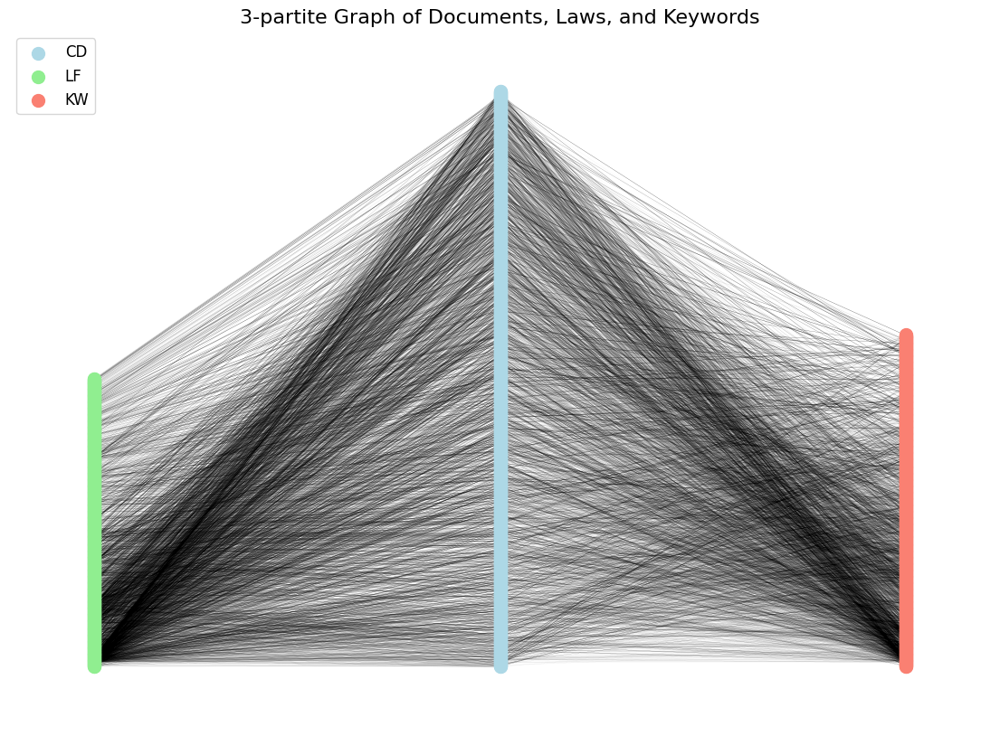

In [8]:
# Adjusted positions to place CD nodes in the middle
pos = {}
pos.update((node, (1, i)) for i, node in enumerate(document_nodes))  # Documents in the middle
pos.update((node, (0, i)) for i, node in enumerate(law_nodes))       # Laws on the left
pos.update((node, (2, i)) for i, node in enumerate(keyword_nodes))   # Keywords on the right

# Draw the graph
plt.figure(figsize=(14, 10))

# Draw nodes
nx.draw_networkx_nodes(G, pos, nodelist=document_nodes, node_color="lightblue", node_size=100, label="CD")
nx.draw_networkx_nodes(G, pos, nodelist=law_nodes, node_color="lightgreen", node_size=100, label="LF")
nx.draw_networkx_nodes(G, pos, nodelist=keyword_nodes, node_color="salmon", node_size=100, label="KW")

# Draw edges with thickness based on weight
nx.draw_networkx_edges(G, pos, width=[G[u][v]['weight'] * 0.2 for u, v in G.edges()])  # Scale edge width

# Optional: Add labels for nodes (uncomment if needed for small illustration graphs)
# nx.draw_networkx_labels(G, pos, font_size=8)

# Add a title and legend
plt.title("3-partite Graph of Documents, Laws, and Keywords", fontsize=16)
plt.legend(loc="upper left", fontsize=12)
plt.axis("off")
plt.show()

### Projection Graph $$ G_{CD \to CD} $$ 

This code **projects the 3-partite graph (`G`) onto document nodes**, creating a new graph where documents are connected based on shared laws and keywords.  

### Key Steps:  
1. **Edge Construction**:  
   - Pairs of documents (`CD`) are linked if they share at least one **law (`LF`)** or **keyword (`KW`)**.  
   - Edge weights are computed as the **average of shared connection weights**.  

2. **Filtering**:  
   - Computes the **average edge weight** and removes edges **below \( 1.1 \times \) this average** (`ALPHA_AVG_FILTER`).  

3. **Graph Analysis**:  
   - Reports node and edge counts.  
   - Identifies **connected components** and extracts the **largest one**.  

This results in a **document similarity graph** where edges represent **semantic/legal connections** based on shared citations and keywords.  


In [19]:
ALPHA_AVG_FILTER = 1.1

# Project the graph on document nodes based on shared laws and keywords
projected_graph = nx.Graph()

# Iterate over all document pairs
for u, v in combinations(document_nodes, 2):
    # Get common neighbors across both laws and keywords
    common_neighbors = set(G.neighbors(u)) & set(G.neighbors(v))
    
    # Skip if no common neighbors
    if not common_neighbors:
        continue
    
    # Compute the combined weight for edges between the documents through common neighbors
    total_weight = sum(
        G[u][neighbor]['weight'] + G[v][neighbor]['weight']
        for neighbor in common_neighbors
    )
    
    # Average the total weight over the number of common neighbors
    avg_common_weight = total_weight / len(common_neighbors)
    
    # Add edge to the projected graph if it meets the threshold
    projected_graph.add_edge(u, v, weight=avg_common_weight)

# Calculate average weight for edges in the projected graph
weights = [d['weight'] for _, _, d in projected_graph.edges(data=True)]
avg_weight = np.mean(weights)
print("avg. weight:", avg_weight)


# Optionally remove edges below the average weight
edges_to_remove = [(u, v) for u, v, d in projected_graph.edges(data=True) if d['weight'] < 1.1*avg_weight]
print(f"removing {len(edges_to_remove)} edges...")
orig_pr_g_edges = projected_graph.number_of_edges()
projected_graph.remove_edges_from(edges_to_remove)

# Print basic properties of the projected graph
print(f"Number of nodes in the projected graph: {projected_graph.number_of_nodes()}")
print(f"Number of edges in the projected graph: {projected_graph.number_of_edges()} (without avg. filtering {orig_pr_g_edges})")
print("--" * 10)

# Find connected components
connected_components = list(nx.connected_components(projected_graph))
num_components = len(connected_components)
print(f"Number of connected components: {num_components}")

# Find the largest connected component
largest_component = max(connected_components, key=len)
largest_subgraph = projected_graph.subgraph(largest_component).copy()
print(f"Largest component size: {largest_subgraph.number_of_nodes()} nodes")

avg. weight: 0.35721636125691786
removing 53588 edges...
Number of nodes in the projected graph: 997
Number of edges in the projected graph: 26152 (without avg. filtering 79740)
--------------------
Number of connected components: 4
Largest component size: 993 nodes


### Main (Edges Betweenness) Filtering

In [20]:
ALPHA_EB_FILTERING = 2

def filter_edges_betweenness(graph, alpha):
    print(f"starting with {len(graph.edges())} edges")    
    edge_betweenness = nx.edge_betweenness_centrality(graph, seed=12)
    centrality_mean = np.mean([centrality for _, centrality in edge_betweenness.items()])
    print("centrality_mean:", centrality_mean)
    edges_to_remove = [edge for edge, centrality in edge_betweenness.items() if centrality < alpha*centrality_mean]
    print(f"removing {len(edges_to_remove)} edges")
    graph.remove_edges_from(edges_to_remove)
    print(f"final number of edges:", graph.number_of_edges())
    
    return graph

temp_graph = filter_edges_betweenness(projected_graph, alpha=ALPHA_EB_FILTERING)
connected_components = list(nx.connected_components(temp_graph))
num_components = len(connected_components)
print(f"\nNumber of connected components: {num_components}")

# Find the largest connected component
largest_component_ = max(connected_components, key=len)
largest_subgraph_ = temp_graph.subgraph(largest_component_).copy()
print(f"Largest component size: {largest_subgraph_.number_of_nodes()} nodes")
print(f"Largest component size (edges): {largest_subgraph_.number_of_edges()} edges")

starting with 26152 edges
centrality_mean: 9.698131509645876e-05
removing 22921 edges
final number of edges: 3231

Number of connected components: 110
Largest component size: 888 nodes
Largest component size (edges): 3231 edges


### Community Detection Using Louvain Method  

This code applies the **Louvain method** to detect **communities** within the **largest connected component** of the projected document graph.  

### Key Steps:  
1. **Community Detection**:  
   - Uses `nx.community.louvain_communities()` to identify communities based on **edge weights**.  
   - Computes **modularity**, a measure of community quality.  

2. **Community Analysis**:  
   - Extracts and prints **top 10 keywords** for each community.  
   - (Optional) Extracts **top law references** per community.  

3. **Visualization**:  
   - Plots each community as a **subgraph**, assigning a unique color.  
   - Uses **spring layout** for better node distribution.  

This helps in understanding how **documents cluster** based on shared **laws and keywords**, revealing thematic or legal patterns.  


Modularity - louvain_communities: 0.5193755357134285 #15
community 0: 61 nodes


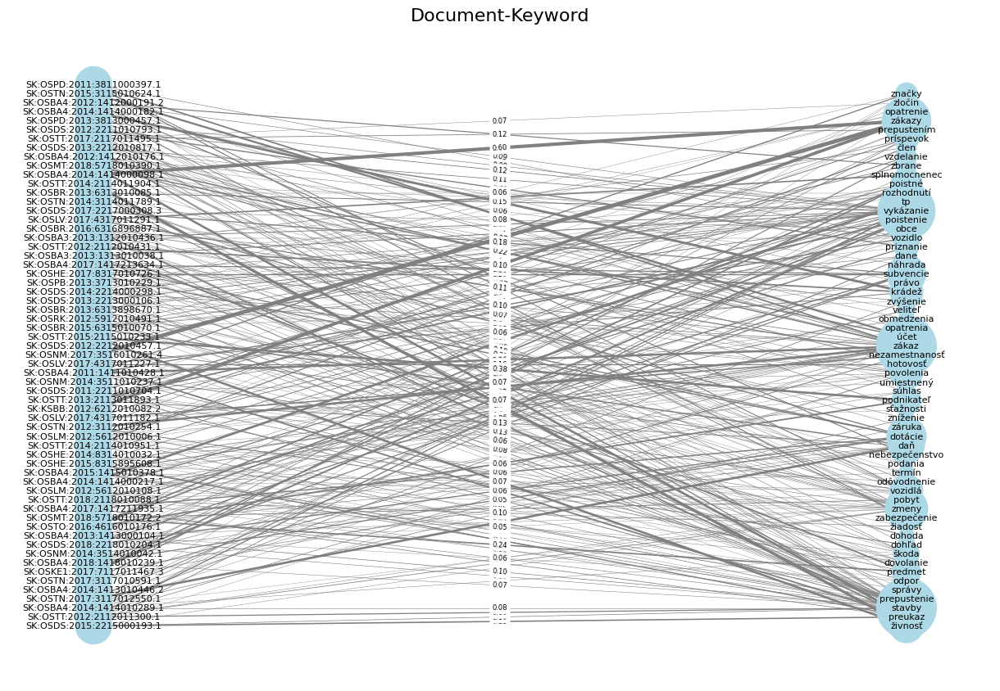

C_0 keywords: ['zákaz', 'stavby', 'vykázanie', 'zákazy', 'preukaz', 'zmeny', 'dotácie', 'subvencie', 'daň', 'poistenie']
C_0 law references: ['2005/300/ver-1#paragraf-348', '2005/300/ver-3#paragraf-348', '2005/300/ver-1#paragraf-66', '2005/300/ver-1#paragraf-276', '2005/300/ver-4#paragraf-348', '2005/300/ver-6#paragraf-348', '2005/300/ver-1#paragraf-61', '2005/300/ver-5#paragraf-348', '2005/300/ver-2#paragraf-37', '2005/300/ver-1#paragraf-44']



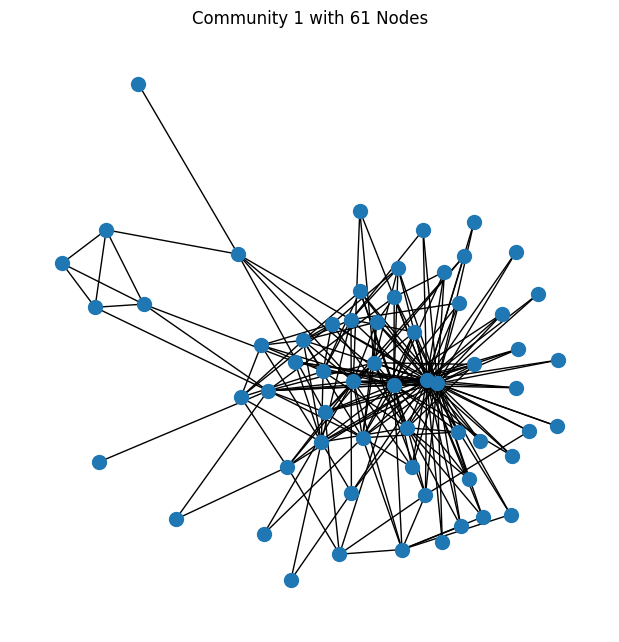

community 1: 36 nodes


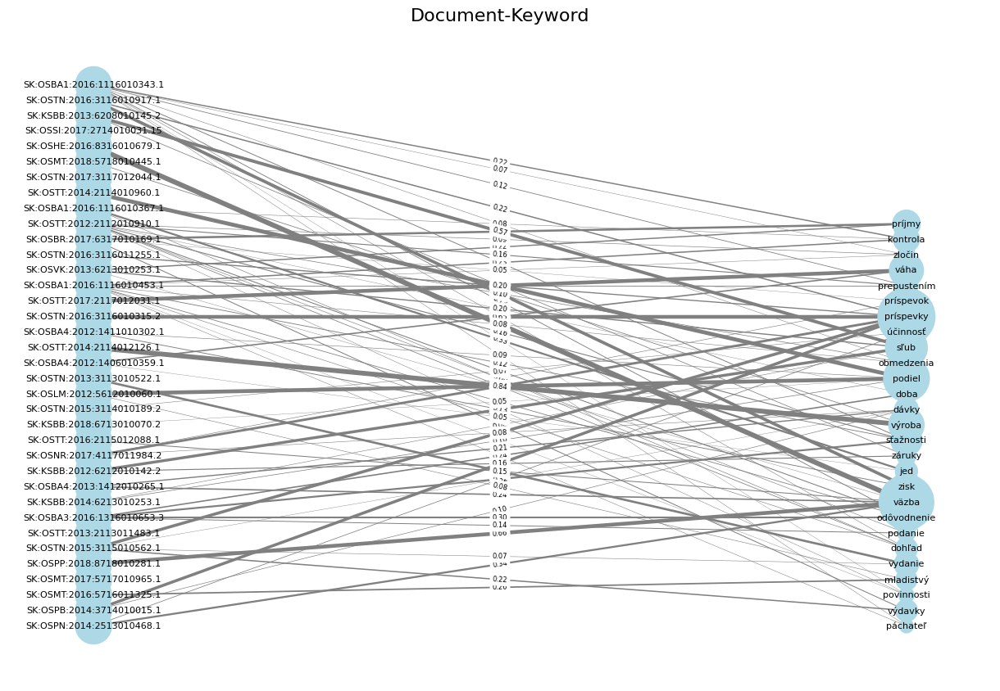

C_1 keywords: ['príspevky', 'väzba', 'podiel', 'sľub', 'výroba', 'váha', 'sťažnosti', 'odôvodnenie', 'zisk', 'príjmy']
C_1 law references: ['2005/300/ver-1#paragraf-172', '2005/300/ver-1#paragraf-250', '2005/301/ver-3#paragraf-448', '2005/300/ver-1#paragraf-66', '2005/300/ver-1#paragraf-117', '2005/301/ver-2#paragraf-415', '2005/300/ver-2#paragraf-68', '2005/300/ver-1#paragraf-411', '2005/300/ver-1#paragraf-187', '2005/300/ver-1#paragraf-68']



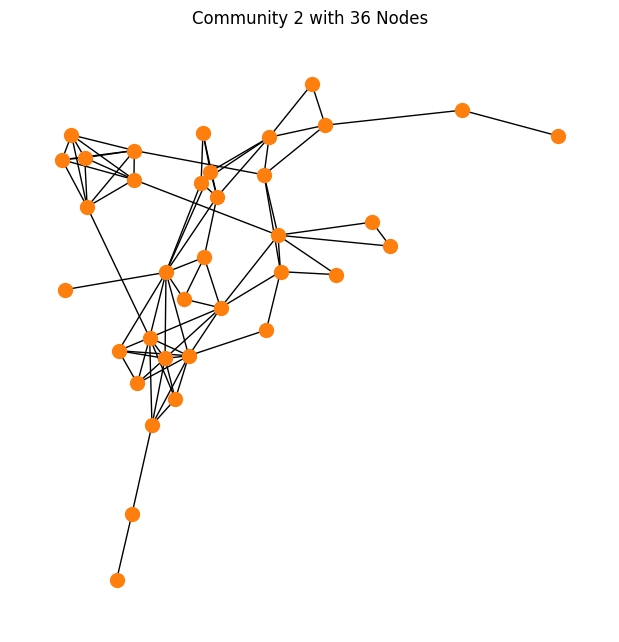

community 2: 31 nodes


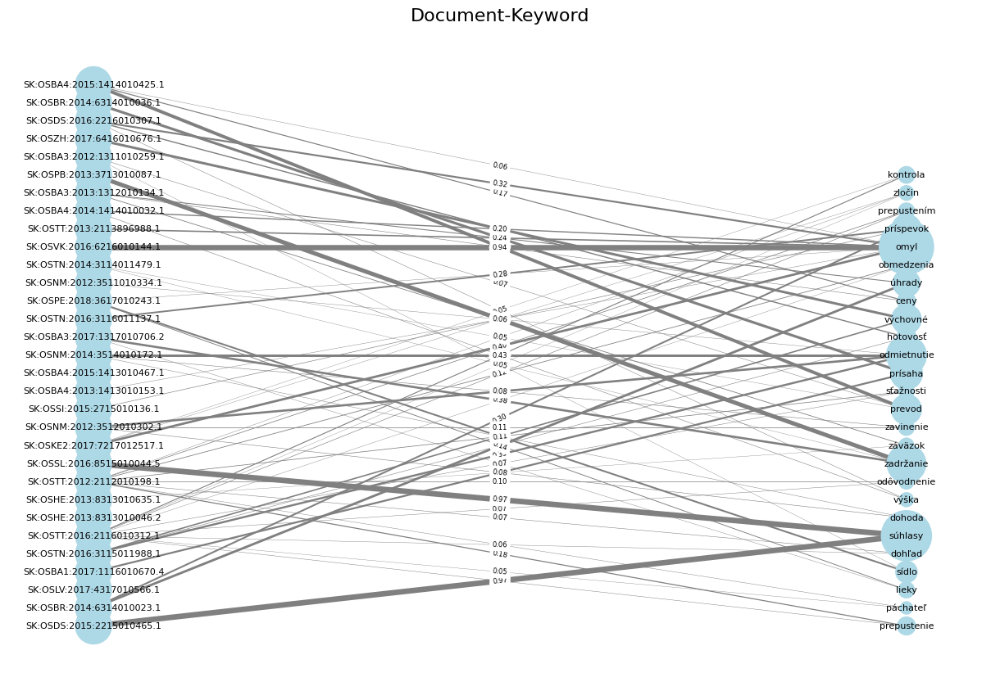

C_2 keywords: ['omyl', 'súhlasy', 'odmietnutie', 'zadržanie', 'prísaha', 'prevod', 'výchovné', 'príspevok', 'úhrady', 'sídlo']
C_2 law references: ['2005/300/ver-1#paragraf-221', '2005/301/ver-1#paragraf-333', '2005/300/ver-1#paragraf-345', '2005/301/ver-2#paragraf-85', '2005/300/ver-2#paragraf-68', '2005/301/ver-2#paragraf-415', '2005/300/ver-1#paragraf-66', '2005/300/ver-2#paragraf-219', '2005/301/ver-2#paragraf-287', '2005/300/ver-1#paragraf-44']



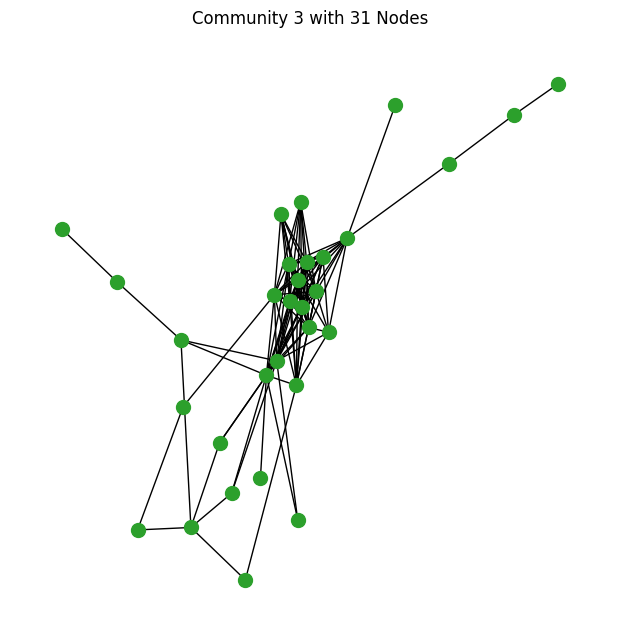

community 3: 78 nodes


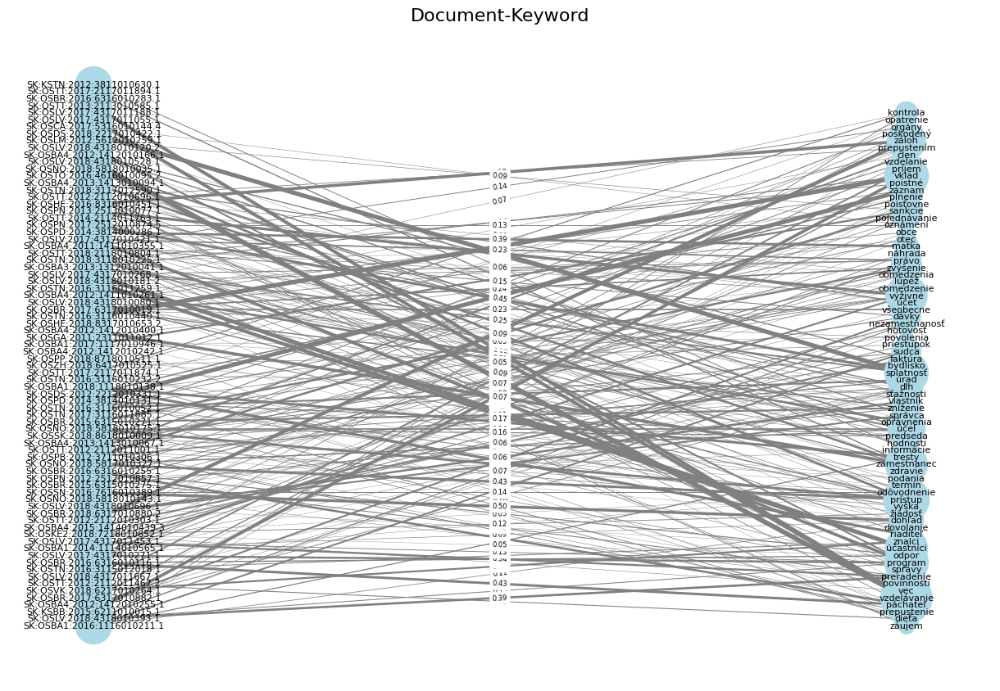

C_3 keywords: ['vzdelávanie', 'prístup', 'vklad', 'program', 'splatnosť', 'účastníci', 'zamestnanec', 'výživné', 'záloh', 'páchateľ']
C_3 law references: ['2005/300/ver-1#paragraf-360', '2005/300/ver-1#paragraf-207', '2005/475/ver-1#paragraf-9', '2005/300/ver-1#paragraf-66', '2005/300/ver-1#paragraf-74', '2005/301/ver-2#paragraf-411', '2005/300/ver-1#paragraf-212', '2005/300/ver-2#paragraf-68', '2005/300/ver-1#paragraf-213', '2005/301/ver-2#paragraf-176']



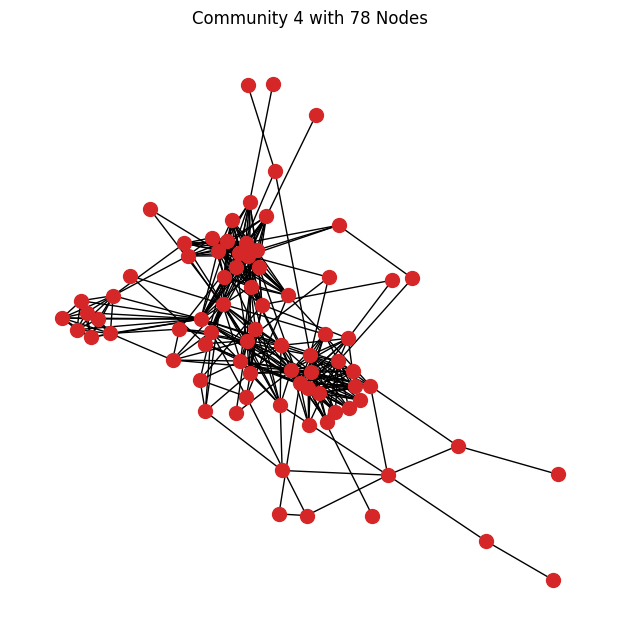

community 4: 104 nodes


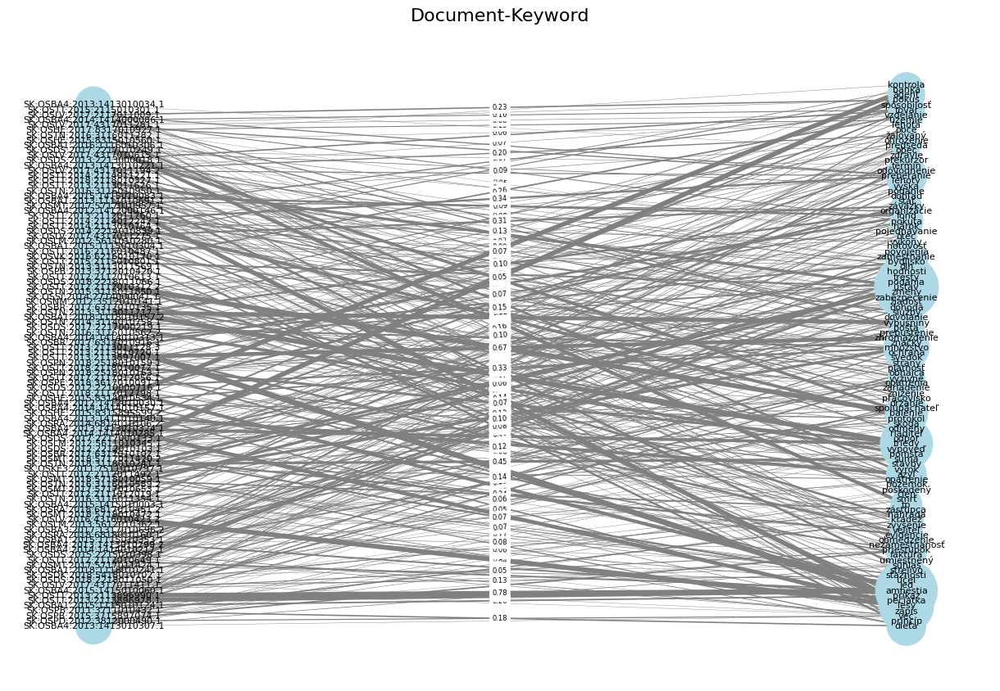

C_4 keywords: ['ústav', 'amnestia', 'lesy', 'triedy', 'množstvo', 'balenie', 'bydlisko', 'preberanie', 'priestupok', 'pečiatka']
C_4 law references: ['2005/300/ver-1#paragraf-212', '2005/300/ver-1#paragraf-66', '2005/301/ver-1#paragraf-407', '2005/300/ver-2#paragraf-68', '1990/372/ver-1#paragraf-50', '2005/301/ver-1#paragraf-474', '2005/300/ver-2#paragraf-212', '2005/301/ver-1#paragraf-182', '2005/301/ver-1#paragraf-66', '2005/300/ver-1#paragraf-353']



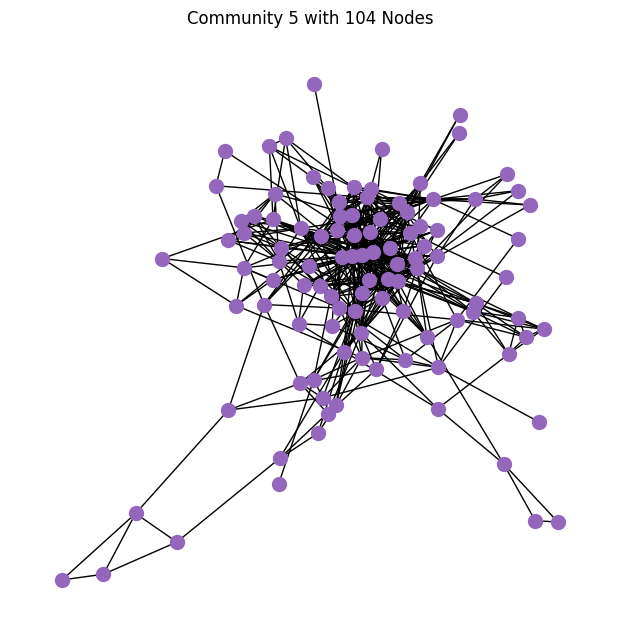

community 5: 88 nodes


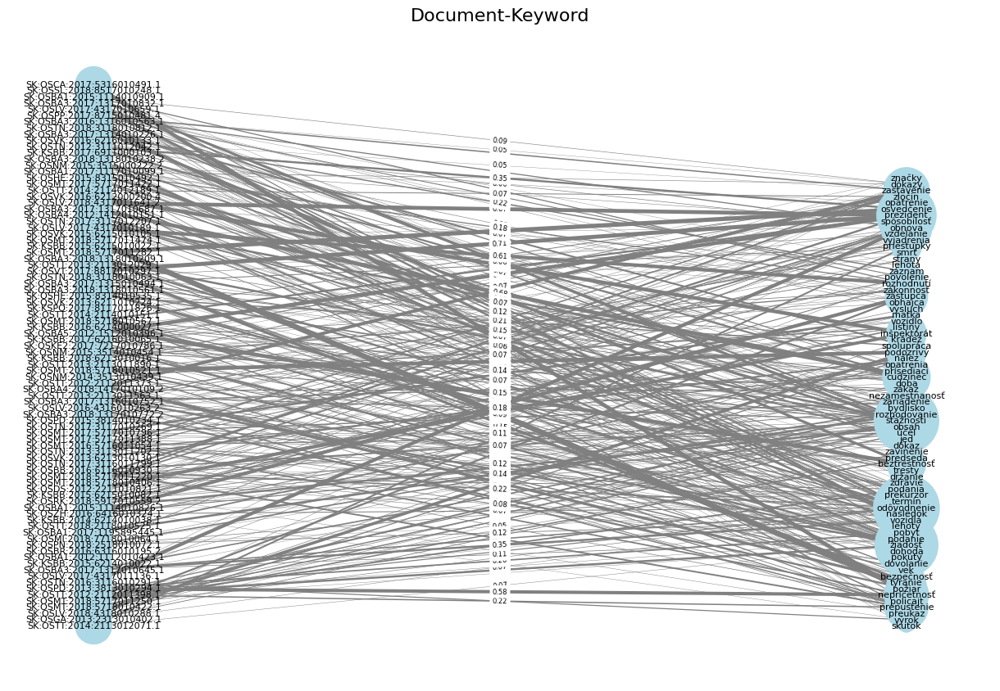

C_5 keywords: ['odôvodnenie', 'sťažnosti', 'žiadosť', 'prezident', 'obsah', 'vozidlá', 'obnova', 'cudzinec', 'zastavenie', 'nepríčetnosť']
C_5 law references: ['2005/301/ver-2#paragraf-176', '2005/300/ver-1#paragraf-69', '2005/300/ver-1#paragraf-74', '2005/300/ver-1#paragraf-66', '2005/301/ver-1#paragraf-394', '2005/300/ver-1#paragraf-352', '2005/300/ver-1#paragraf-208', '2005/301/ver-1#paragraf-62', '2005/300/ver-1#paragraf-92', '2005/300/ver-2#paragraf-132']



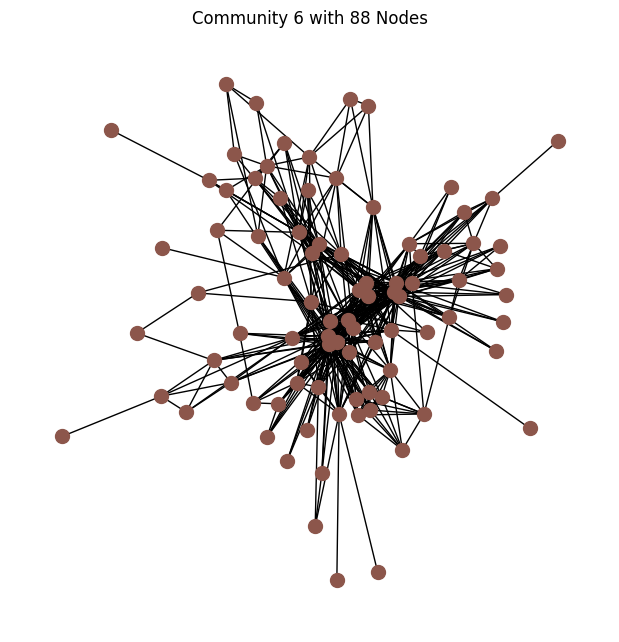

community 6: 58 nodes


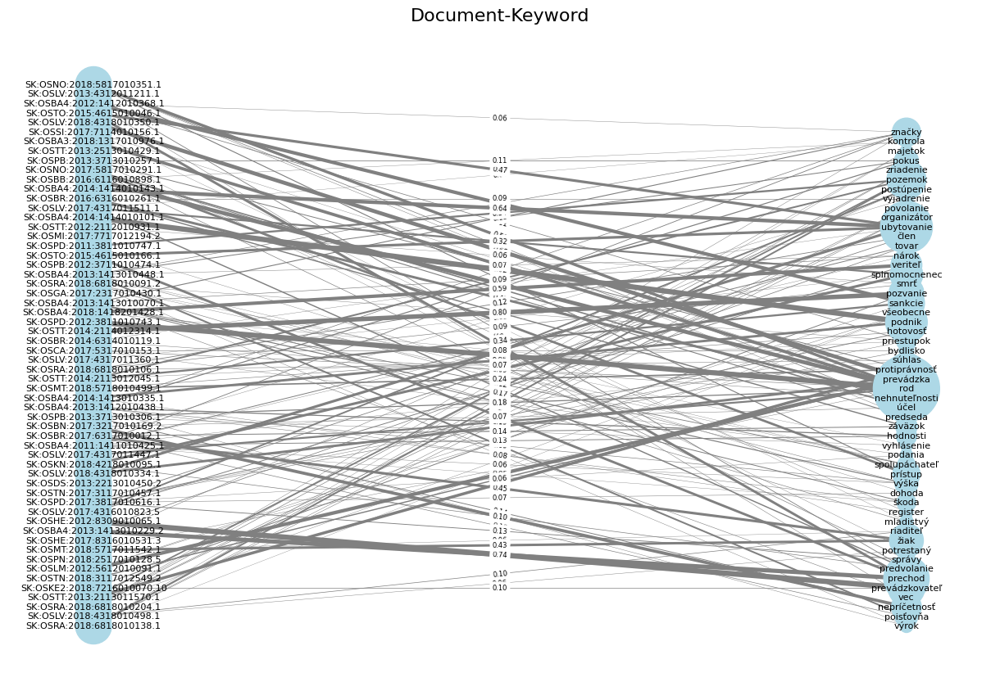

C_6 keywords: ['rod', 'ubytovanie', 'prevádzka', 'prechod', 'podnik', 'pozemok', 'prevádzkovateľ', 'sankcie', 'pozvanie', 'protiprávnosť']
C_6 law references: ['2005/300/ver-1#paragraf-194', '2005/300/ver-1#paragraf-189', '2005/300/ver-1#paragraf-245', '2005/300/ver-1#paragraf-74', '2005/300/ver-1#paragraf-66', '2005/301/ver-1#paragraf-407', '2005/300/ver-1#paragraf-286', '2005/300/ver-1#paragraf-212', '1965/59/ver-1#paragraf-49', '2005/301/ver-2#paragraf-176']



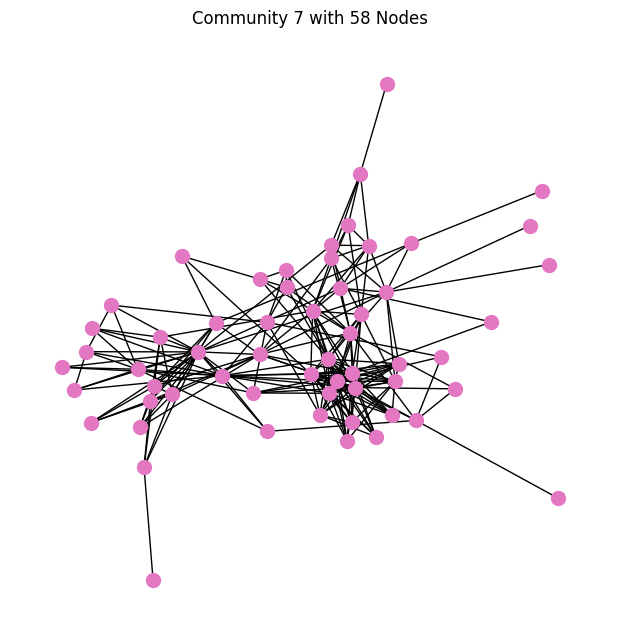

community 7: 54 nodes


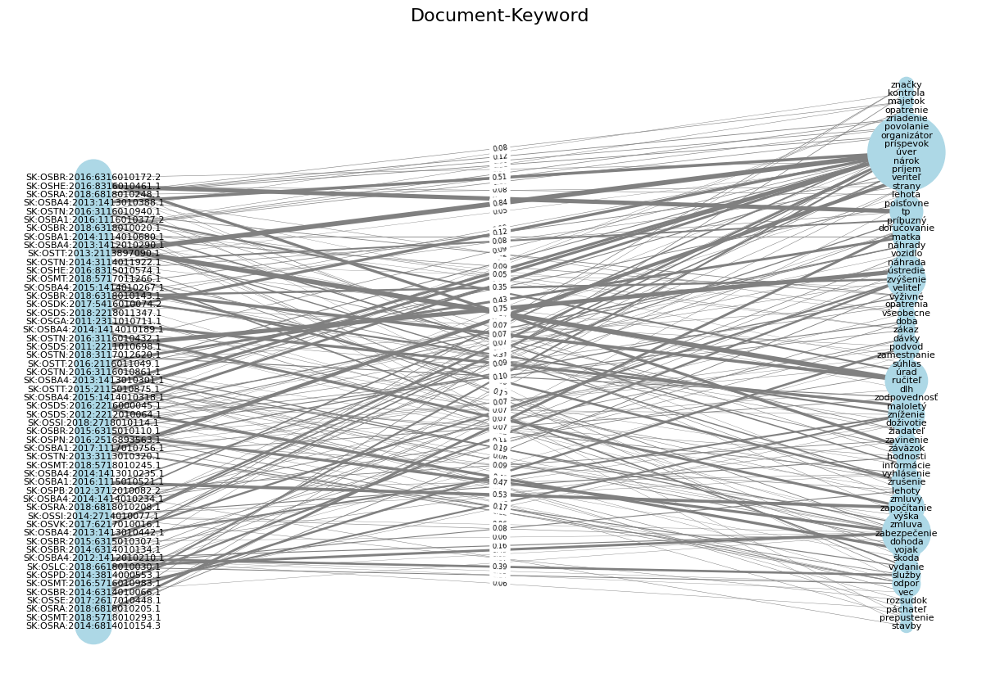

C_7 keywords: ['úver', 'zabezpečenie', 'ručiteľ', 'zvýšenie', 'zníženie', 'započítanie', 'ústredie', 'tp', 'veriteľ', 'zrušenie']
C_7 law references: ['2005/300/ver-1#paragraf-222', '2005/300/ver-1#paragraf-211', '2005/300/ver-3#paragraf-364', '2005/300/ver-1#paragraf-66', '2005/300/ver-2#paragraf-211', '2005/300/ver-2#paragraf-68', '2005/301/ver-2#paragraf-415', '2005/300/ver-1#paragraf-212', '2005/300/ver-2#paragraf-364', '2005/300/ver-1#paragraf-415']



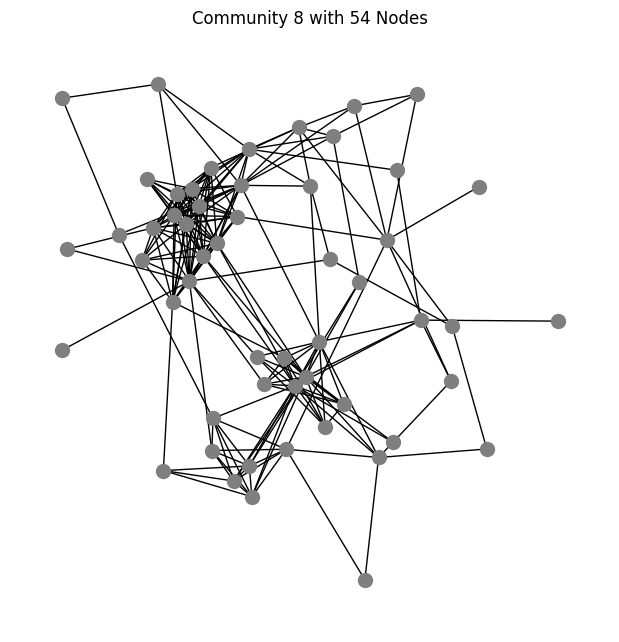

community 8: 59 nodes


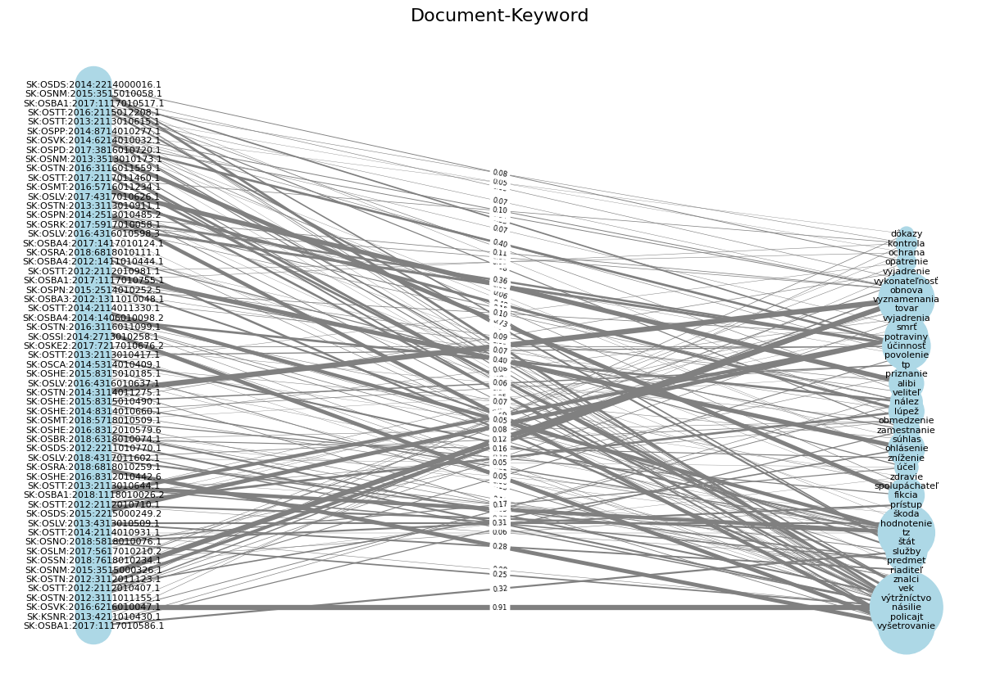

C_8 keywords: ['násilie', 'tz', 'vyšetrovanie', 'vyznamenania', 'účinnosť', 'potraviny', 'služby', 'ohlásenie', 'fikcia', 'lúpež']
C_8 law references: ['2005/300/ver-1#paragraf-188', '2005/300/ver-1#paragraf-63', '2005/300/ver-1#paragraf-66', '2005/300/ver-1#paragraf-323', '2005/300/ver-3#paragraf-51', '2005/301/ver-1#paragraf-74', '2005/300/ver-1#paragraf-1', '2005/300/ver-2#paragraf-68', '2005/300/ver-1#paragraf-74', '2005/301/ver-1#paragraf-407']



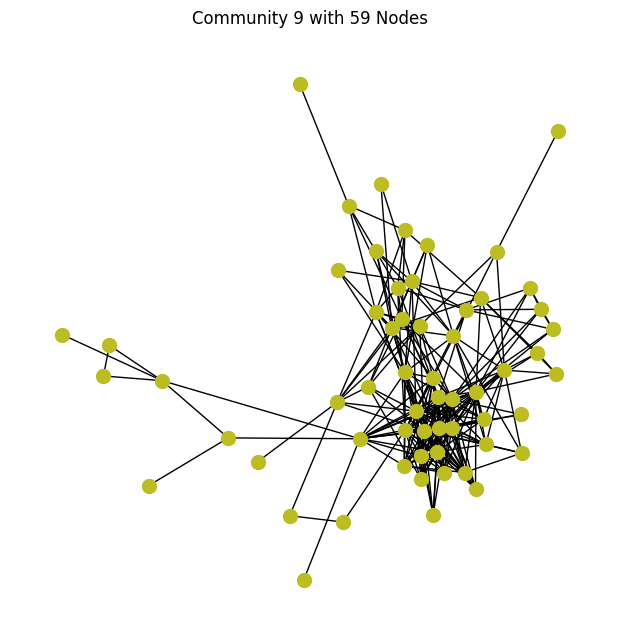

community 9: 11 nodes


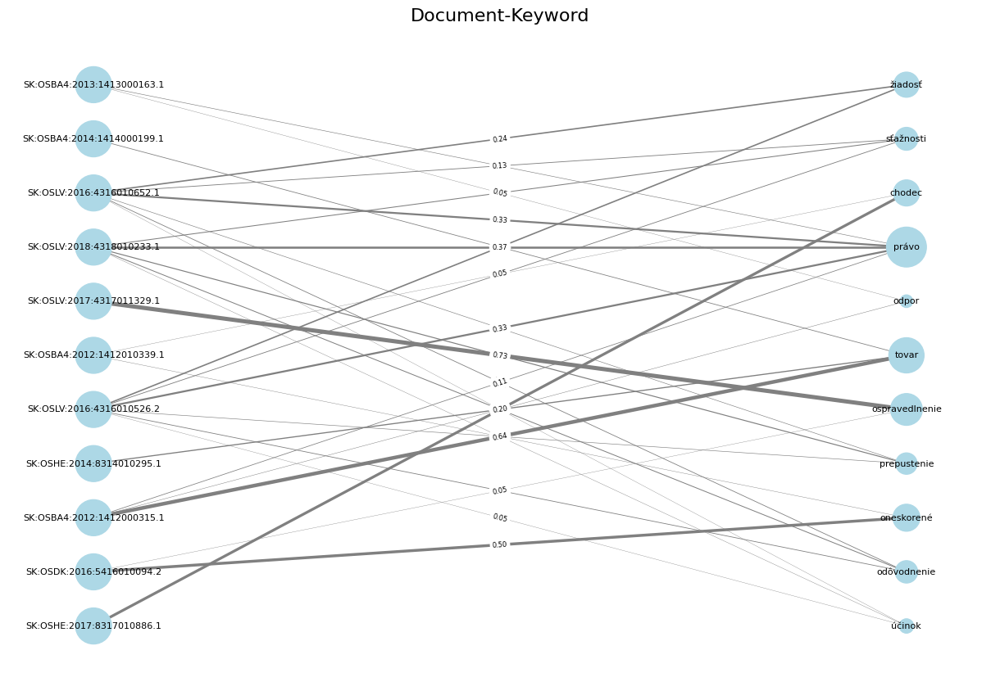

C_9 keywords: ['právo', 'tovar', 'ospravedlnenie', 'oneskorené', 'chodec', 'žiadosť', 'sťažnosti', 'odôvodnenie', 'prepustenie', 'účinok']
C_9 law references: ['2005/300/ver-1#paragraf-66', '2005/300/ver-1#paragraf-279', '2005/301/ver-2#paragraf-176']



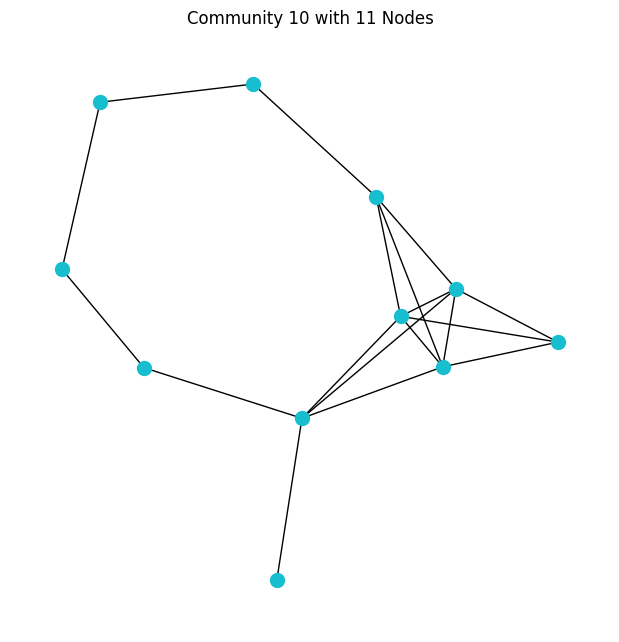

community 10: 87 nodes


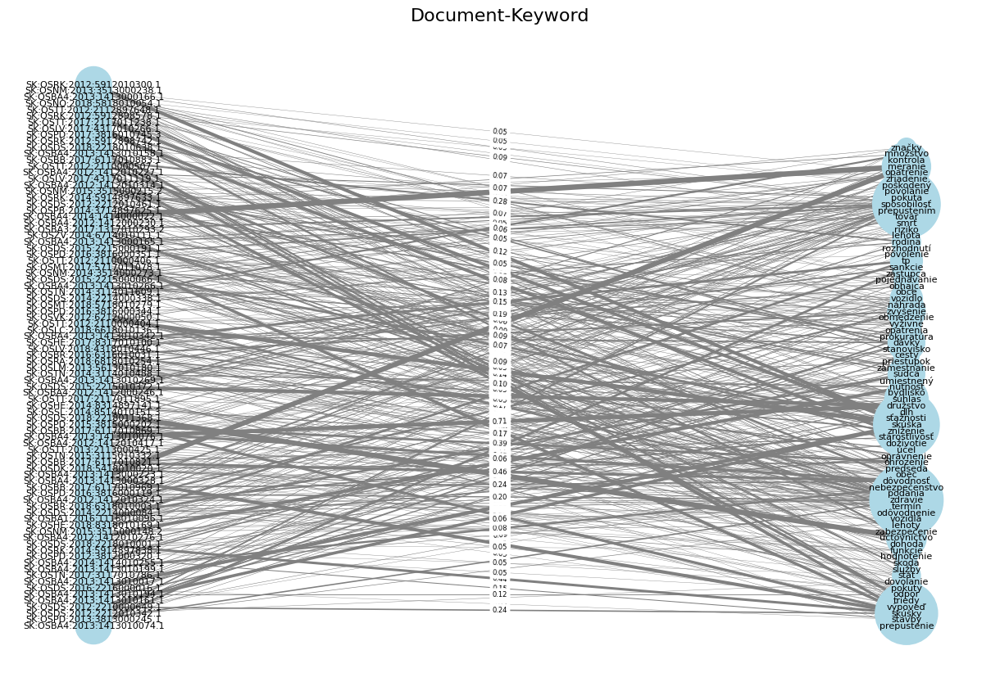

C_10 keywords: ['zdravie', 'spôsobilosť', 'skúška', 'skúšky', 'meranie', 'dôvodnosť', 'súhlas', 'družstvo', 'účtovníctvo', 'zvýšenie']
C_10 law references: ['2005/300/ver-2#paragraf-289', '2005/300/ver-1#paragraf-61', '2005/301/ver-3#paragraf-355', '2005/300/ver-1#paragraf-66', '2005/301/ver-2#paragraf-211', '2005/301/ver-3#paragraf-353', '2005/300/ver-1#paragraf-38', '2005/301/ver-2#paragraf-415', '1990/372/ver-1#paragraf-50', '2005/300/ver-1#paragraf-36']



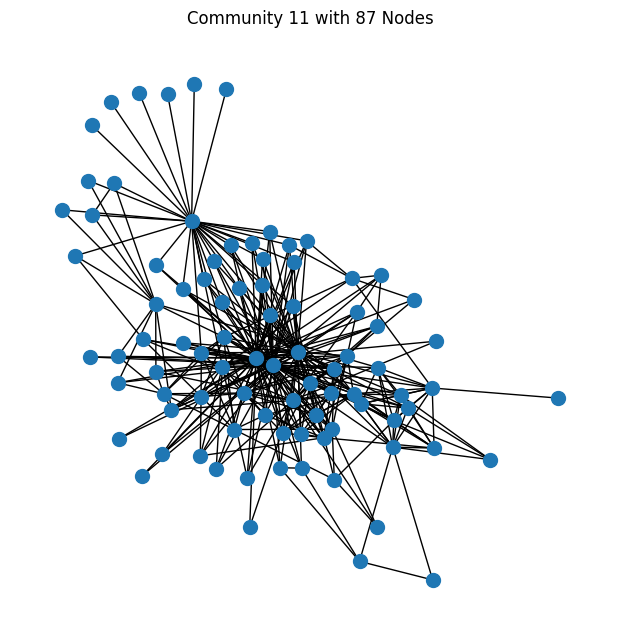

community 11: 29 nodes


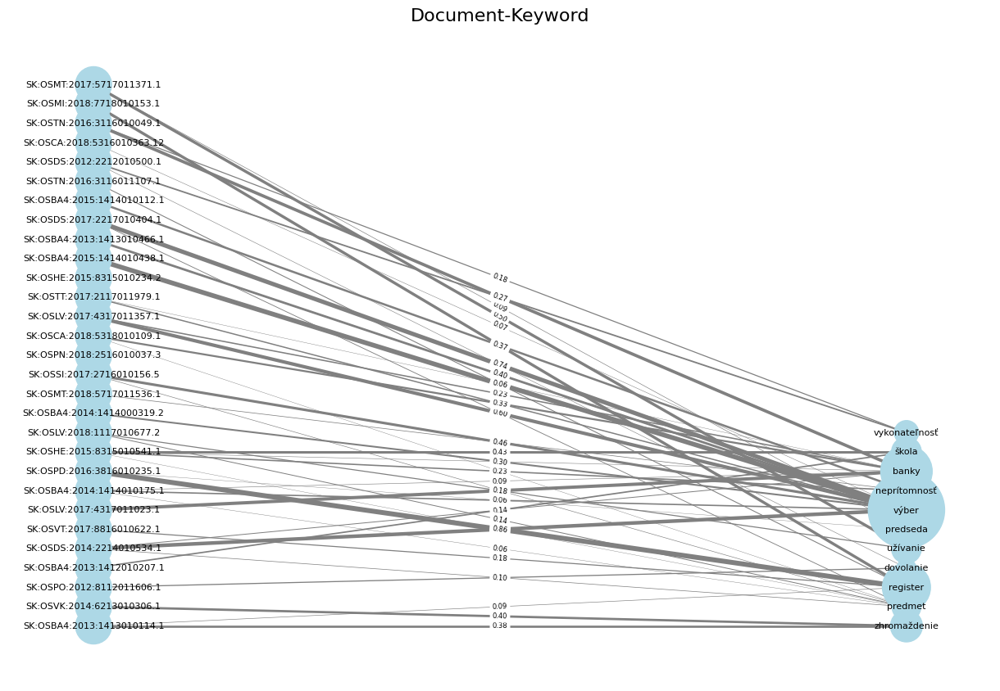

C_11 keywords: ['výber', 'banky', 'register', 'zhromaždenie', 'neprítomnosť', 'škola', 'užívanie', 'predmet', 'vykonateľnosť', 'dovolanie']
C_11 law references: ['2005/300/ver-2#paragraf-219', '2005/300/ver-1#paragraf-216', '2005/300/ver-1#paragraf-66', '2005/300/ver-1#paragraf-55', '2005/301/ver-2#paragraf-176', '2005/300/ver-2#paragraf-68', '2005/300/ver-2#paragraf-247', '2005/301/ver-2#paragraf-415', '2005/300/ver-1#paragraf-415', '2005/300/ver-1#paragraf-119']



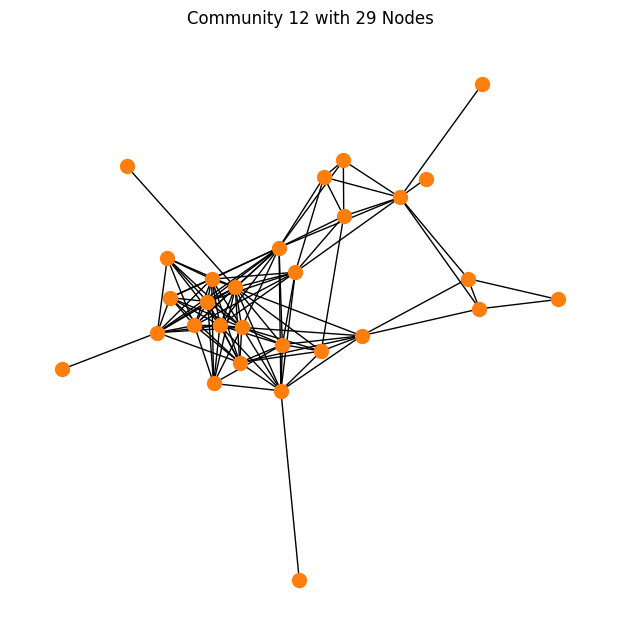

community 12: 61 nodes


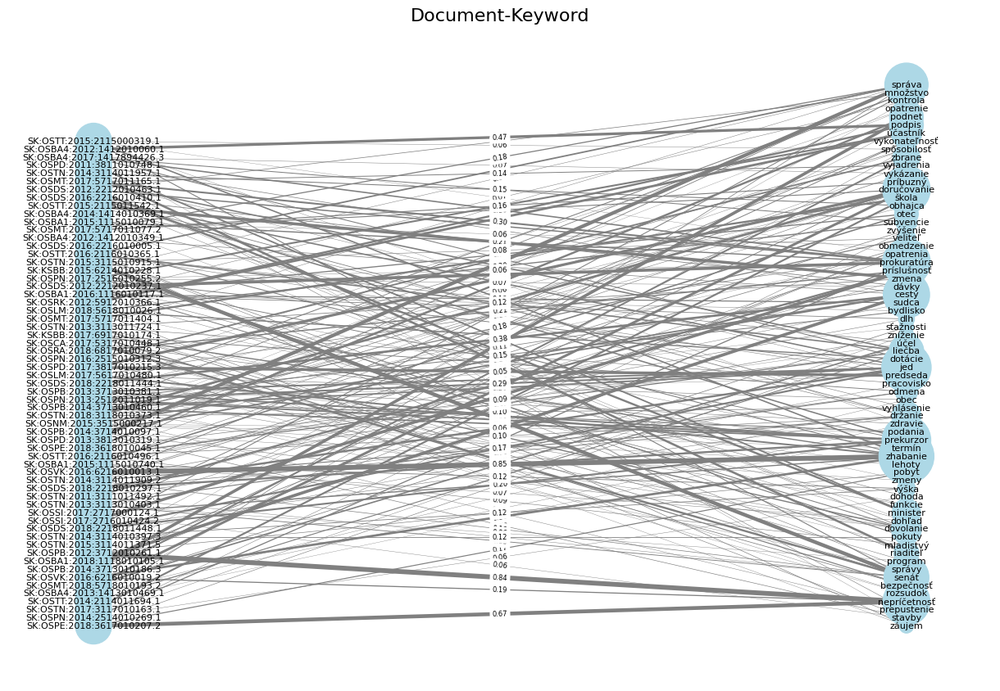

C_12 keywords: ['zhabanie', 'jed', 'prekurzor', 'prokuratúra', 'doručovanie', 'nepríčetnosť', 'cesty', 'senát', 'správa', 'príslušnosť']
C_12 law references: ['2005/300/ver-1#paragraf-74', '2005/301/ver-3#paragraf-448', '2005/300/ver-1#paragraf-171', '2005/301/ver-1#paragraf-174', '2005/300/ver-1#paragraf-289', '2005/301/ver-1#paragraf-180', '2005/300/ver-1#paragraf-51', '2005/300/ver-1#paragraf-66', '2005/300/ver-1#paragraf-83', '2005/300/ver-1#paragraf-68']



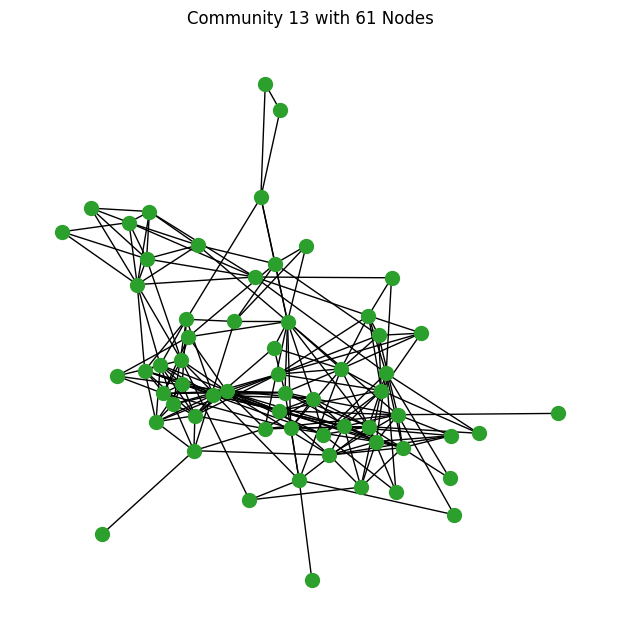

community 13: 88 nodes


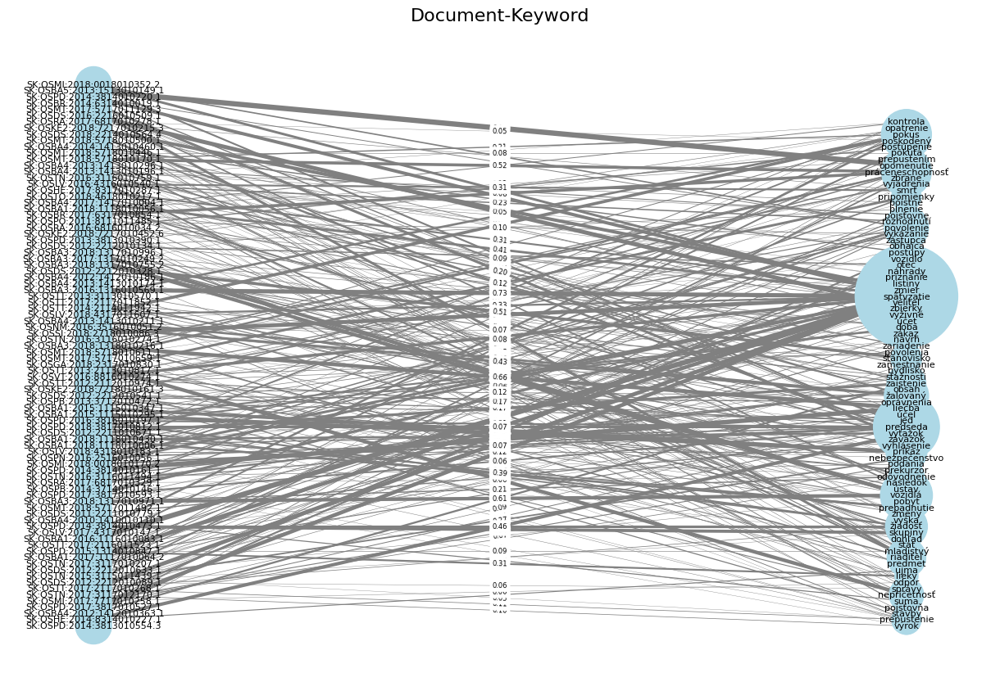

C_13 keywords: ['späťvzatie', 'predseda', 'vozidlá', 'pokus', 'práceneschopnosť', 'liečba', 'žalovaný', 'povolenie', 'žiadosť', 'výťažok']
C_13 law references: ['2005/301/ver-1#paragraf-396', '2005/300/ver-1#paragraf-74', '2005/300/ver-1#paragraf-69', '2005/301/ver-1#paragraf-312', '2005/301/ver-3#paragraf-448', '2005/300/ver-2#paragraf-68', '2005/300/ver-1#paragraf-92', '2005/301/ver-2#paragraf-415', '2005/300/ver-1#paragraf-149', '2005/300/ver-1#paragraf-66']



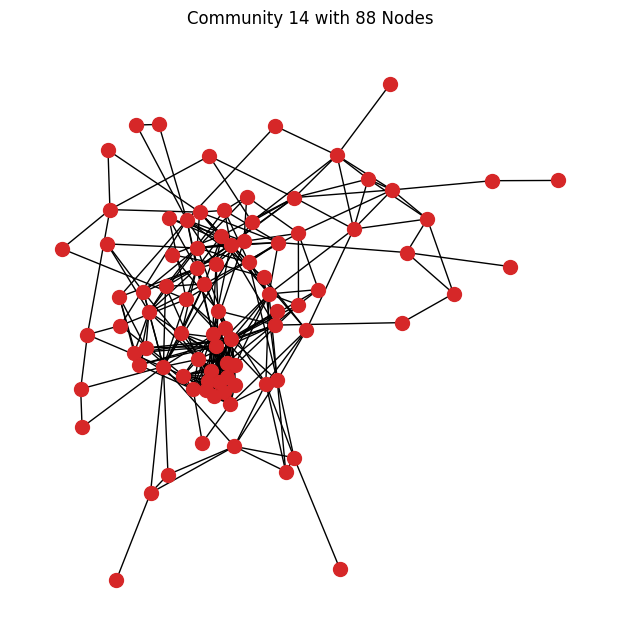

community 14: 43 nodes


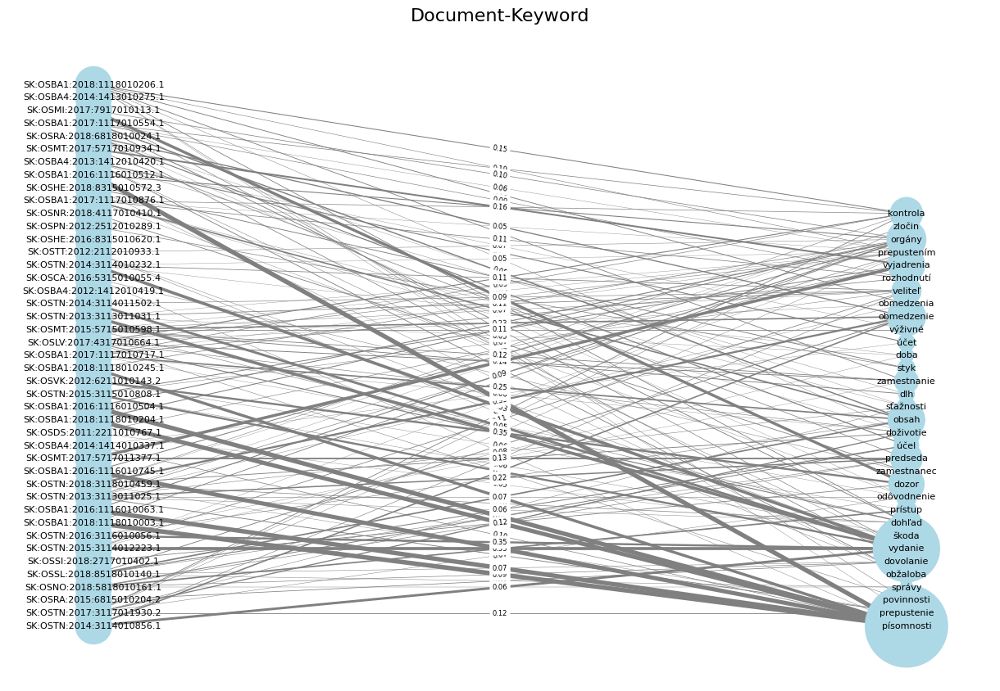

C_14 keywords: ['písomnosti', 'vydanie', 'orgány', 'obmedzenie', 'obsah', 'vyjadrenia', 'dozor', 'kontrola', 'predseda', 'prepustením']
C_14 law references: ['2005/301/ver-1#paragraf-68', '2005/300/ver-2#paragraf-67', '2005/300/ver-1#paragraf-68', '2005/300/ver-1#paragraf-415', '2005/300/ver-1#paragraf-201', '2005/300/ver-1#paragraf-66', '2005/301/ver-3#paragraf-448', '2005/300/ver-1#paragraf-248', '2005/300/ver-1#paragraf-257', '2005/300/ver-2#paragraf-51']



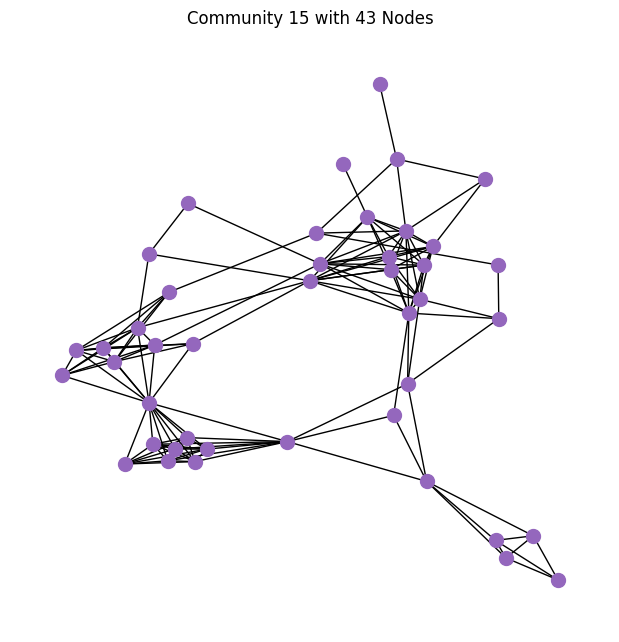

In [23]:
# Detect communities using the Louvain method
communities = nx.community.louvain_communities(largest_subgraph_, weight='weight', resolution=0.9, seed=12)
modularity = nx.community.modularity(largest_subgraph_,  communities, weight='weight')
print(f"Modularity - louvain_communities: {modularity} #{len(communities)}")

# Plot each community separately
for idx, comm in enumerate(communities):
    # Extract the subgraph for the current community
    community_subgraph = largest_subgraph.subgraph(comm)
    print(f"community {idx}: {len(comm)} nodes")

    top_keywords = top_k(G, comm, mode='doc-keyword', top_k=10, plot=True)
    top_lawref = top_k(G, comm, mode='doc-law', top_k=10, plot=False)

    print(f"C_{idx} keywords: {[kw [0] for kw in top_keywords]}")
    print(f"C_{idx} law references: {[lr [0] for lr in top_lawref]}\n")


    # Generate a layout for the community
    pos = nx.spring_layout(community_subgraph)
    # Create a figure for the community
    plt.figure(figsize=(6, 6))
    nx.draw(
        community_subgraph,
        pos,
        with_labels=False,
        node_size=100,
        font_size=8,
        font_weight='bold',
        node_color=f"C{idx}"  # Assign a unique color for the community
    )
    plt.title(f"Community {idx + 1} with {len(comm)} Nodes")
    plt.show()

### Iterative Kernighan-Lin (KL) Bisection for Community Detection  

This code applies **iterative KL bisection** to recursively split the **largest connected component** of the document graph into smaller communities **based on modularity**.  

### Key Steps:  
1. **Recursive Graph Partitioning**:  
   - Uses `nx.community.kernighan_lin_bisection()` to split graphs into two subgraphs.  
   - Computes **modularity** to determine if further splitting is beneficial.  

2. **Stopping Criteria**:  
   - A subgraph is **not split** if:  
     - It has ≤ **5 nodes**.  
     - Its modularity is **below the threshold** (`modularity_threshold = 0.25`).  
     - It has too few **top keywords** or **law references**.  

3. **Hierarchy Tracking**:  
   - Maintains a **hierarchical structure** of splits (parent-child relationships).  
   - Stores **top keywords and law references** for each detected community.  

4. **Visualization (Commented Out)**:  
   - **Heatmap of inter-community connections**.  
   - **Graph visualization** showing emerging communities with colored nodes.  

This results in a **hierarchical community structure**, where documents are grouped based on **shared laws and keywords** at multiple levels.  


In [26]:
def get_nesting_level(index, hierarchy):
        level = 0
        while index is not None:
            level += 1
            index = hierarchy[index]["parent"]
        return level

def iterative_kl_bisection_with_visualizations(graph, modularity_threshold, weight=None, seed=None):
    subgraphs_to_split = [(graph, None)]
    final_communities = []
    hierarchy = []

    while subgraphs_to_split:
        current_graph, parent_index = subgraphs_to_split.pop()
        partition = nx.community.kernighan_lin_bisection(current_graph, weight=weight, seed=seed)
        modularity = nx.community.modularity(current_graph, partition, weight=weight)
        top_keywords = top_k(G, current_graph.nodes(), mode='doc-keyword', top_k=7, plot=False)
        top_law_ref = top_k(G, current_graph.nodes(), mode='doc-law', top_k=7, plot=False)

        stop_rule = len(current_graph) <= 5 or modularity < modularity_threshold or len(top_keywords) < 7 or len(top_law_ref) < 7
        
        if stop_rule:
            community_nodes = set(current_graph.nodes())
            final_communities.append(community_nodes)

            hierarchy.append({
                "nodes": list(community_nodes),
                "parent": parent_index,
                "children": [],
                "keywords": [w[0] for w in top_keywords],
                "law_references": [lr[0] for lr in top_law_ref]
            })
            continue

        current_index = len(hierarchy)
        hierarchy_entry = {
            "nodes": list(set(current_graph.nodes())),
            "parent": parent_index,
            "children": [],
            "modularity after split": round(modularity, 3),
            "keywords": [w[0] for w in top_keywords],
            "law_references": [lr[0] for lr in top_law_ref]
        }
        hierarchy.append(hierarchy_entry)

        if parent_index is not None:
            hierarchy[parent_index]["children"].append(current_index)

        nesting_level = get_nesting_level(parent_index, hierarchy) if parent_index is not None else 0
        indent = "  " * nesting_level

        print(f"{indent}Split (mod: {modularity:.2f}) subgraph with {len(current_graph.nodes())} nodes into:")
        print(f"{indent}  - Community 1 size: {len(partition[0])}")
        print(f"{indent}  - Community 2 size: {len(partition[1])}")

        # Generate heatmap of inter-community connections
        """
        partition_nodes = [partition[0], partition[1]]
        community_adj_matrix = np.zeros((2, 2))

        # Calculate weights between partitions
        for u, v, data in current_graph.edges(data=True):
            weight_val = data.get("weight", 1)
            comm_u = 0 if u in partition[0] else 1
            comm_v = 0 if v in partition[0] else 1
            community_adj_matrix[comm_u, comm_v] += weight_val
            if comm_u != comm_v:
                community_adj_matrix[comm_v, comm_u] += weight_val

        # Plot heatmap
        plt.figure(figsize=(6, 4))
        sns.heatmap(
            community_adj_matrix,
            fmt=".1f",
            xticklabels=[f"$C_{1}$", f"$C_{2}$"],
            yticklabels=[f"$C_{1}$", f"$C_{2}$"],
        )
        plt.title(f"Inter-Community Connection Heatmap (Level {nesting_level})")
        plt.xlabel("Community")
        plt.ylabel("Community")
        plt.show()
        """
        
        # Plot the whole graph with node colors based on emerging communities
        """
        community_colors = {}
        for idx, nodes in enumerate(partition_nodes):
            for node in nodes:
                community_colors[node] = f"C{idx}"
        
        # Extract edge weights for visualization
        edge_weights = [data.get("weight", 1) for _, _, data in current_graph.edges(data=True)]
        
        
        pos = nx.spring_layout(current_graph, seed=42)  # Use a consistent layout
        plt.figure(figsize=(8, 8))
        nx.draw(
            current_graph,
            pos,
            with_labels=False,
            node_size=100,
            node_color=[community_colors[node] for node in current_graph.nodes()],
            edge_color="gray",
            alpha=0.7,
            width=[w * 0.5 for w in edge_weights],  # Scale edge widths by weight
        )
        plt.title(f"Network Visualization After Split (Level {nesting_level})")
        plt.show()
        """
        subgraphs_to_split.append((current_graph.subgraph(partition[0]).copy(), current_index))
        subgraphs_to_split.append((current_graph.subgraph(partition[1]).copy(), current_index))

    return final_communities, hierarchy


G_final = largest_subgraph_.copy()
modularity_threshold = 0.25

# Perform the iterative KL bisection
communities, hierarchy = iterative_kl_bisection_with_visualizations(G_final, modularity_threshold, weight='weight', seed=12)

Split (mod: 0.30) subgraph with 888 nodes into:
  - Community 1 size: 444
  - Community 2 size: 444
  Split (mod: 0.33) subgraph with 444 nodes into:
    - Community 1 size: 222
    - Community 2 size: 222
    Split (mod: 0.38) subgraph with 222 nodes into:
      - Community 1 size: 111
      - Community 2 size: 111
      Split (mod: 0.39) subgraph with 111 nodes into:
        - Community 1 size: 55
        - Community 2 size: 56
        Split (mod: 0.39) subgraph with 56 nodes into:
          - Community 1 size: 28
          - Community 2 size: 28
          Split (mod: 0.48) subgraph with 28 nodes into:
            - Community 1 size: 14
            - Community 2 size: 14
            Split (mod: 0.26) subgraph with 14 nodes into:
              - Community 1 size: 7
              - Community 2 size: 7
            Split (mod: 0.28) subgraph with 14 nodes into:
              - Community 1 size: 7
              - Community 2 size: 7
          Split (mod: 0.35) subgraph with 28 nodes into:

### Hierarchical Community Visualization with Plotly  

This function creates an interactive **treemap** to visualize community hierarchies. It displays **community size**, **modularity**, **keywords**, and **law references** on hover, with nested splits based on community structure.  


In [27]:
def plot_hierarchy_with_plotly(hierarchy):
    # Prepare data for the treemap
    data = []
    for i, entry in enumerate(hierarchy):
        parent = entry["parent"] if entry["parent"] is not None else "Others"
        mod = entry.get("modularity after split", "N/A")
        keywords = "<br>".join(entry.get("keywords", []))  # Combine keywords into a single string
        law_references = "<br>".join(entry.get("law_references", []))  # Combine law references into a single string
        data.append({
            "Community": f"{i}",
            "Parent": f"{parent}",
            "Nodes": len(entry["nodes"]),
            "Modularity": mod,
            "Keywords": keywords,  # Add keywords as a column
            "Law References": law_references  # Add law references as a column
        })

    # Convert to DataFrame
    df = pd.DataFrame(data)

    # Create the treemap
    fig = px.treemap(
        df,
        path=[px.Constant("Others"), "Parent", "Community"],
        values="Nodes",
        color="Nodes",
        hover_data={"Modularity": True},
        title="Court Decisions Treemap with Keywords and Law References",
    )

    # Customize the main text display with two columns
    fig.update_traces(
        texttemplate="Keywords:<br>%{customdata[0]}<br><br>Law References:<br>%{customdata[1]}",
        customdata=df[["Keywords", "Law References"]],  # Custom data for texttemplate
        textposition="middle center",
        textfont=dict(size=9)
    )

    # Adjust layout for better readability
    fig.update_layout(
        margin=dict(t=50, l=25, r=25, b=25),
    )
    
    fig.show()
    #return df

# Example usage (replace `hierarchy` with your data structure)
plot_hierarchy_with_plotly(hierarchy)